#Compas dataset

https://www.kaggle.com/datasets/danofer/compass/data

In [8]:
!pip install -U pandas
!pip install -U ydata-profiling
!pip install -U sentence-transformers

In [9]:
import pandas as pd
from ydata_profiling import ProfileReport

df = pd.read_csv("../data/raw/cox-violent-parsed_filt.csv")
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Interessante dingen die we uit het profile report halen
- aardig wat duplicate rows
- charge degree imbalance
- violen recid imbalance
- event ?
- 2x decile score?
- veel imbalances


c = eerste overtreding
r = tweede overtreding
vr = violent tweede overtreding
v = violent kans
juv = juvenile




interactions
decile score en priors count lijken met elkaar samen te hangen

nog meer voor correlatie checken

niks op te merken bij missing values, id is toch niet van belang

sample
dagen in jail leuke feature
hoop overbodige variabelen
categorische variabelen kunnen one-hot encoded worden
charge description vectorizen?
is_recid = label

days_b_screening_arrest??
days_from_compas??
event???


In [73]:
# Data cleaning

data = df.copy(deep=True)
data = data.drop(columns=["id"])
data = data.drop_duplicates()

# check for equality in "duplicate" columns
print(data["priors_count"].equals(data["priors_count.1"]))
print(data["decile_score"].equals(data["decile_score.1"]))

data["c_charge_degree"] = data["c_charge_degree"].str[1]

data = data[["sex", "age", "age_cat", "race", "juv_fel_count", "decile_score", "juv_misd_count", "juv_other_count", "priors_count", "c_jail_in", 
            "c_jail_out", "c_charge_degree", "c_charge_desc", "is_recid", "r_charge_degree", "r_charge_desc", "is_violent_recid", 
             "vr_charge_degree", "vr_charge_desc", "score_text", "v_decile_score", "v_score_text"]]

data = pd.get_dummies(data, columns=["sex", "age_cat", "race", "c_charge_degree"])

# Drop sex aangezien het binair is, opzich zouden de anderen ook n-1 kunnen worden, maar voor inzichten later is het beter om ze te houden
data = data.drop(columns=["sex_Male"])

data.head()

True
True


,age,juv_fel_count,decile_score,juv_misd_count,juv_other_count,priors_count,c_jail_in,c_jail_out,c_charge_desc,is_recid,r_charge_degree,r_charge_desc,is_violent_recid,vr_charge_degree,vr_charge_desc,score_text,v_decile_score,v_score_text,sex_Female,age_cat_25 - 45,age_cat_Greater than 45,age_cat_Less than 25,race_African-American,race_Asian,race_Caucasian,race_Hispanic,race_Native American,race_Other,c_charge_degree_C,c_charge_degree_F,c_charge_degree_M,c_charge_degree_N,c_charge_degree_T,c_charge_degree_X
0,69,0,1,0,0,0,13/08/2013 6:03,14/08/2013 5:41,Aggravated Assault w/Firearm,0,NaN,NaN,0,NaN,NaN,Low,1,Low,False,False,True,False,False,False,False,False,False,True,False,True,False,False,False,False
2,31,0,5,0,0,0,NaN,NaN,NaN,-1,NaN,NaN,0,NaN,NaN,Medium,2,Low,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False
3,34,0,3,0,0,0,26/01/2013 3:45,05/02/2013 5:36,Felony Battery w/Prior Convict,1,(F3),Felony Battery (Dom Strang),1,(F3),Felony Battery (Dom Strang),Low,1,Low,False,True,False,False,True,False,False,False,False,False,False,True,False,False,False,False
4,24,0,4,0,1,4,13/04/2013 4:58,14/04/2013 7:02,Possession of Cocaine,1,(M1),Driving Under The Influence,0,NaN,NaN,Low,3,Low,False,False,False,True,True,False,False,False,False,False,False,True,False,False,False,False
9,23,0,8,1,0,1,NaN,NaN,Possession of Cannabis,0,NaN,NaN,0,NaN,NaN,High,6,Medium,False,False,False,True,True,False,False,False,False,False,False,True,False,False,False,False


In [38]:
# Feature engineering

# Hours in jail
data["c_jail_out"] = pd.to_datetime(data["c_jail_out"], dayfirst=True)
data["c_jail_in"] = pd.to_datetime(data["c_jail_in"], dayfirst=True)
data["hours_in_jail"] = ((data["c_jail_out"] - data["c_jail_in"]).dt.total_seconds()) / 3600

data.head()

,age,juv_fel_count,decile_score,juv_misd_count,juv_other_count,priors_count,c_jail_in,c_jail_out,c_charge_degree,c_charge_desc,is_recid,r_charge_degree,r_charge_desc,is_violent_recid,vr_charge_degree,vr_charge_desc,score_text,v_decile_score,v_score_text,sex_Female,age_cat_25 - 45,age_cat_Greater than 45,age_cat_Less than 25,race_African-American,race_Asian,race_Caucasian,race_Hispanic,race_Native American,race_Other,days_in_jail
0,69,0,1,0,0,0,2013-08-13 06:03:00,2013-08-14 05:41:00,(F3),Aggravated Assault w/Firearm,0,NaN,NaN,0,NaN,NaN,Low,1,Low,False,False,True,False,False,False,False,False,False,True,23.633333
2,31,0,5,0,0,0,NaT,NaT,NaN,NaN,-1,NaN,NaN,0,NaN,NaN,Medium,2,Low,False,True,False,False,False,False,True,False,False,False,NaN
3,34,0,3,0,0,0,2013-01-26 03:45:00,2013-02-05 05:36:00,(F3),Felony Battery w/Prior Convict,1,(F3),Felony Battery (Dom Strang),1,(F3),Felony Battery (Dom Strang),Low,1,Low,False,True,False,False,True,False,False,False,False,False,241.850000
4,24,0,4,0,1,4,2013-04-13 04:58:00,2013-04-14 07:02:00,(F3),Possession of Cocaine,1,(M1),Driving Under The Influence,0,NaN,NaN,Low,3,Low,False,False,False,True,True,False,False,False,False,False,26.066667
9,23,0,8,1,0,1,NaT,NaT,(F3),Possession of Cannabis,0,NaN,NaN,0,NaN,NaN,High,6,Medium,False,False,False,True,True,False,False,False,False,False,NaN


In [39]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

.gitattributes:   0%|          | 0.00/690 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.69k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/314 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

In [49]:
charge_descriptions = data["c_charge_desc"].astype(str).values

col = model.encode(charge_descriptions, show_progress_bar=True, normalize_embeddings=True, convert_to_numpy=True)
data.head()

Batches:   0%|          | 0/354 [00:00<?, ?it/s]

,age,juv_fel_count,decile_score,juv_misd_count,juv_other_count,priors_count,c_jail_in,c_jail_out,c_charge_degree,c_charge_desc,is_recid,r_charge_degree,r_charge_desc,is_violent_recid,vr_charge_degree,vr_charge_desc,score_text,v_decile_score,v_score_text,sex_Female,age_cat_25 - 45,age_cat_Greater than 45,age_cat_Less than 25,race_African-American,race_Asian,race_Caucasian,race_Hispanic,race_Native American,race_Other,days_in_jail
0,69,0,1,0,0,0,2013-08-13 06:03:00,2013-08-14 05:41:00,(F3),Aggravated Assault w/Firearm,0,NaN,NaN,0,NaN,NaN,Low,1,Low,False,False,True,False,False,False,False,False,False,True,23.633333
2,31,0,5,0,0,0,NaT,NaT,NaN,NaN,-1,NaN,NaN,0,NaN,NaN,Medium,2,Low,False,True,False,False,False,False,True,False,False,False,NaN
3,34,0,3,0,0,0,2013-01-26 03:45:00,2013-02-05 05:36:00,(F3),Felony Battery w/Prior Convict,1,(F3),Felony Battery (Dom Strang),1,(F3),Felony Battery (Dom Strang),Low,1,Low,False,True,False,False,True,False,False,False,False,False,241.850000
4,24,0,4,0,1,4,2013-04-13 04:58:00,2013-04-14 07:02:00,(F3),Possession of Cocaine,1,(M1),Driving Under The Influence,0,NaN,NaN,Low,3,Low,False,False,False,True,True,False,False,False,False,False,26.066667
9,23,0,8,1,0,1,NaT,NaT,(F3),Possession of Cannabis,0,NaN,NaN,0,NaN,NaN,High,6,Medium,False,False,False,True,True,False,False,False,False,False,NaN


In [74]:
data = data.drop(columns=["c_jail_in", "c_jail_out", "c_charge_desc", "r_charge_degree", "r_charge_desc", "vr_charge_degree", "vr_charge_desc", "score_text", "v_score_text"])
data.head()

,age,juv_fel_count,decile_score,juv_misd_count,juv_other_count,priors_count,is_recid,is_violent_recid,v_decile_score,sex_Female,age_cat_25 - 45,age_cat_Greater than 45,age_cat_Less than 25,race_African-American,race_Asian,race_Caucasian,race_Hispanic,race_Native American,race_Other,c_charge_degree_C,c_charge_degree_F,c_charge_degree_M,c_charge_degree_N,c_charge_degree_T,c_charge_degree_X
0,69,0,1,0,0,0,0,0,1,False,False,True,False,False,False,False,False,False,True,False,True,False,False,False,False
2,31,0,5,0,0,0,-1,0,2,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False
3,34,0,3,0,0,0,1,1,1,False,True,False,False,True,False,False,False,False,False,False,True,False,False,False,False
4,24,0,4,0,1,4,1,0,3,False,False,False,True,True,False,False,False,False,False,False,True,False,False,False,False
9,23,0,8,1,0,1,0,0,6,False,False,False,True,True,False,False,False,False,False,False,True,False,False,False,False


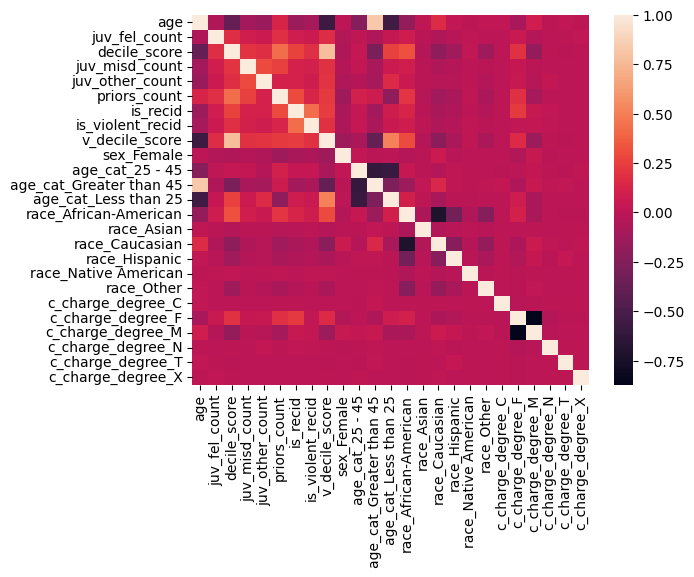

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(data.corr())
plt.show()